
Dijkstra Algorithm with 3715 nodes
----------------------------------------


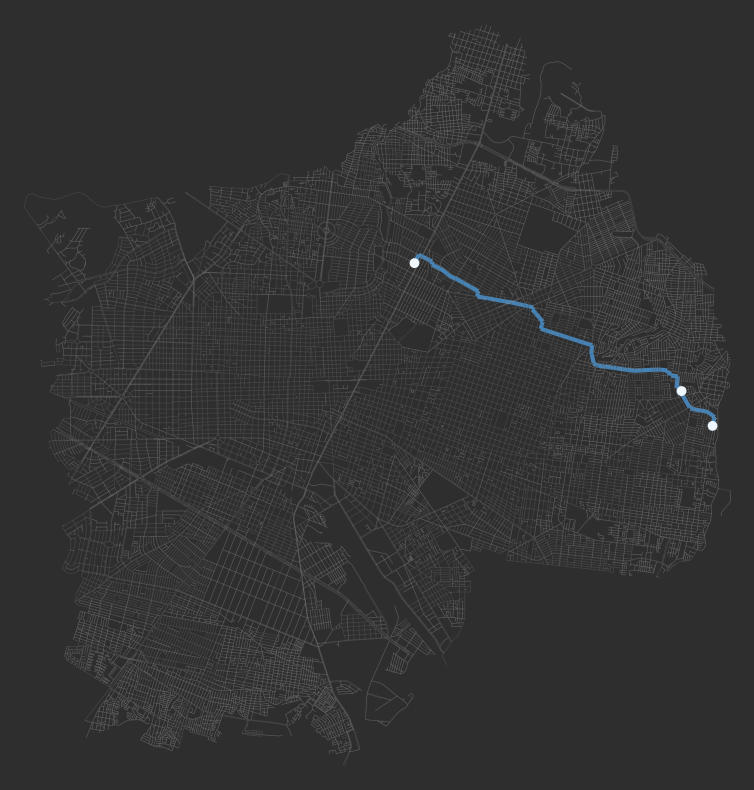

Nodes: 3715		Time: 4.6421s

Prim Algorithm with 3715 nodes
-----------------------------------


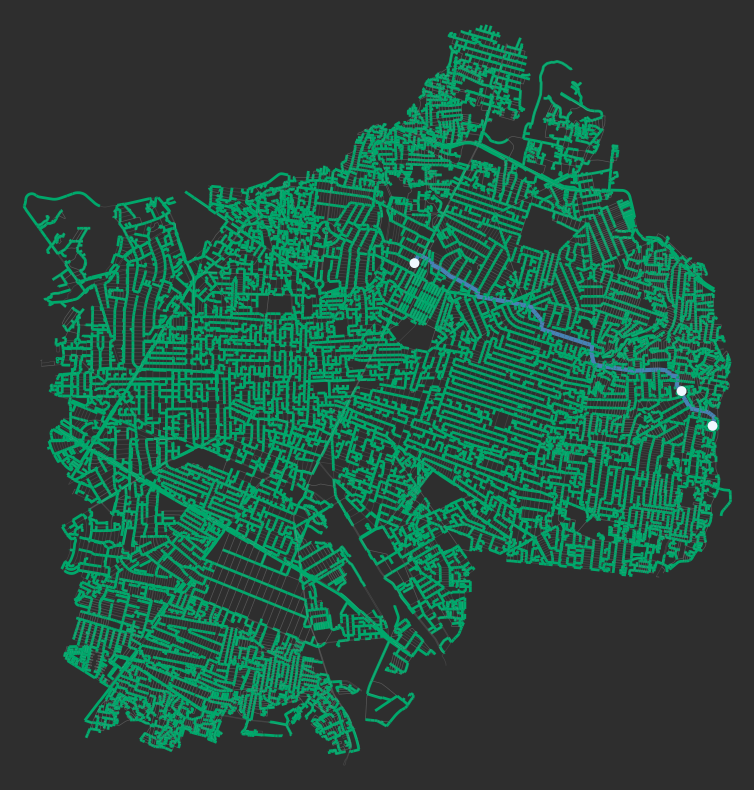

Nodes: 3715		Time: 4.0538s


Dijkstra Algorithm with 7430 nodes
----------------------------------------


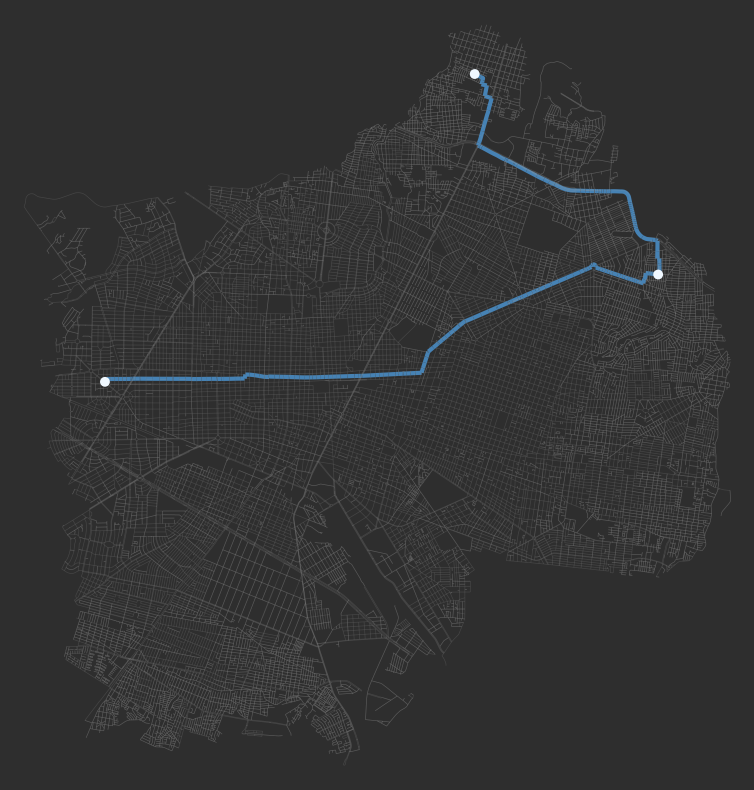

Nodes: 7430		Time: 4.1755s

Prim Algorithm with 7430 nodes
-----------------------------------


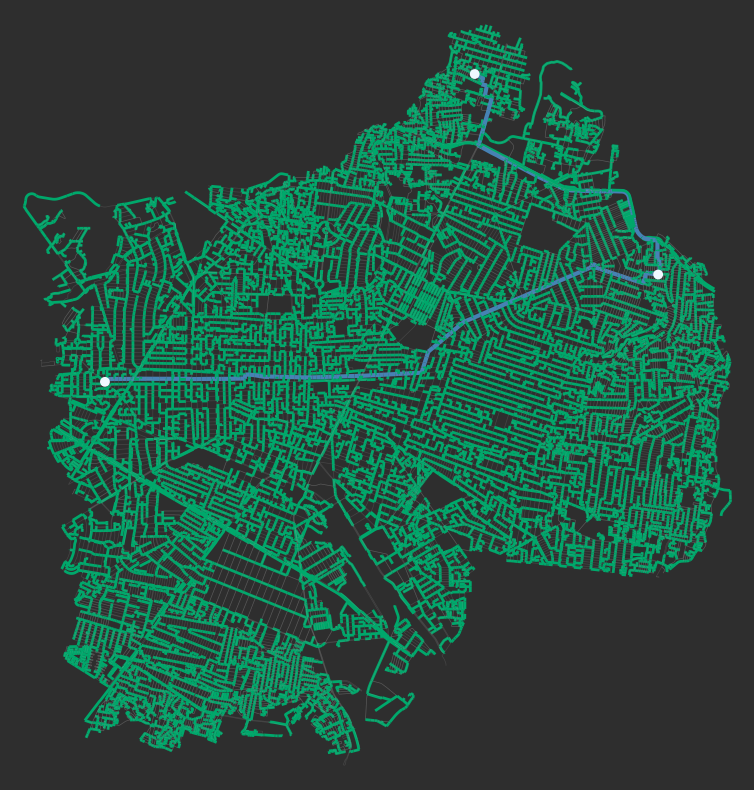

Nodes: 7430		Time: 3.7213s


Dijkstra Algorithm with 11145 nodes
----------------------------------------


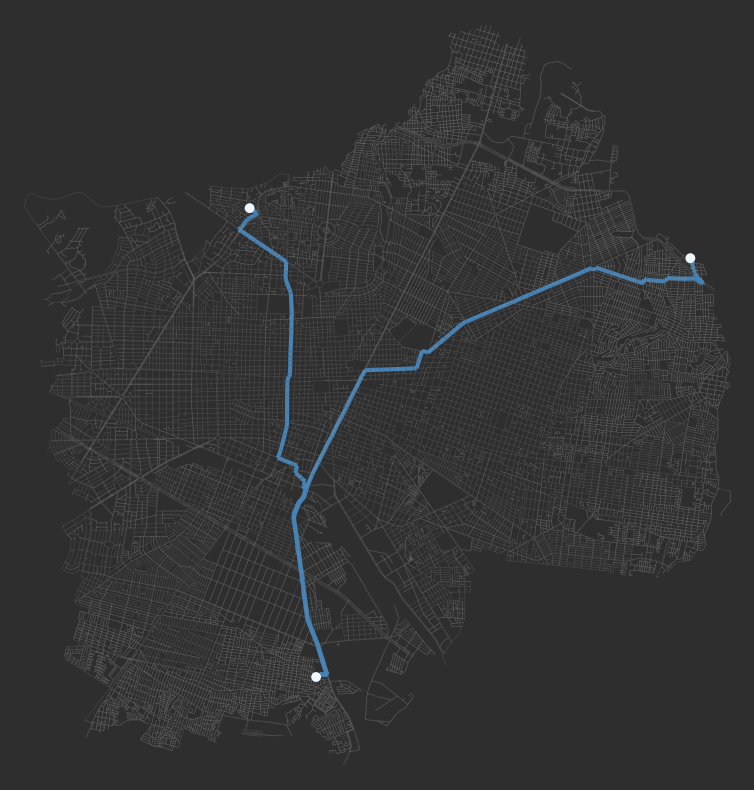

Nodes: 11145		Time: 4.6508s

Prim Algorithm with 11145 nodes
-----------------------------------


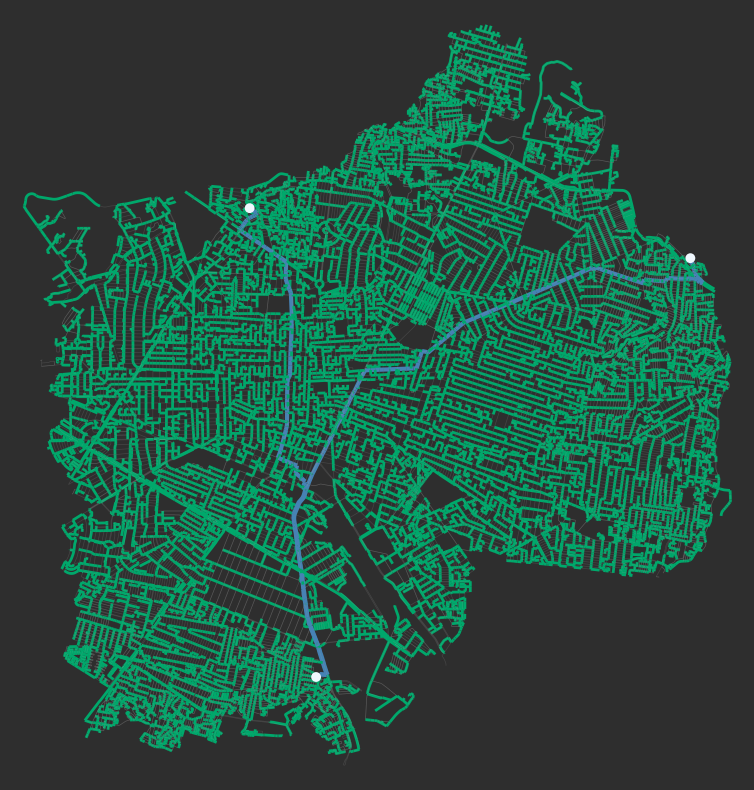

Nodes: 11145		Time: 4.1845s


Dijkstra Algorithm with 14860 nodes
----------------------------------------


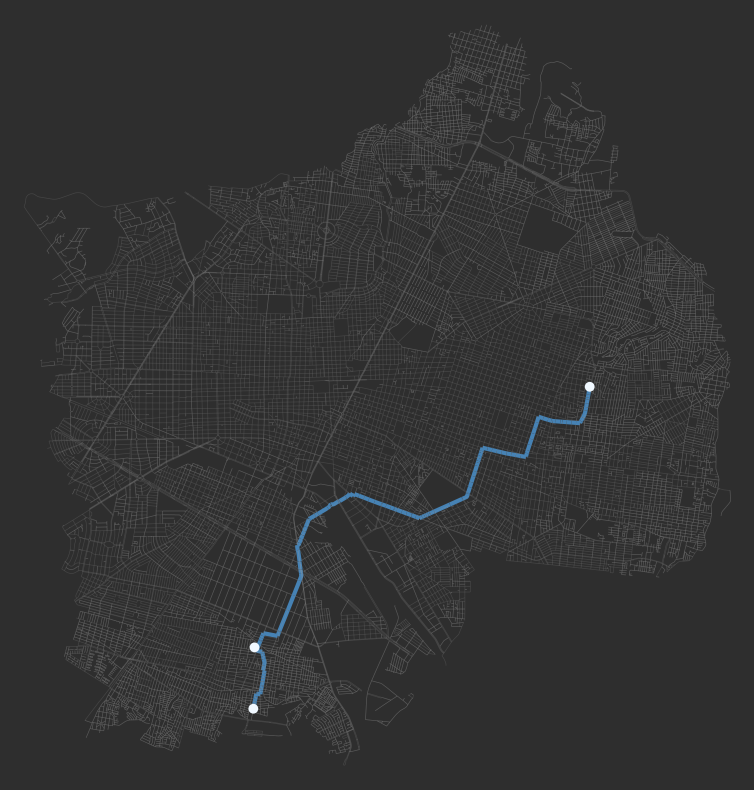

Nodes: 14860		Time: 4.2910s

Prim Algorithm with 14860 nodes
-----------------------------------


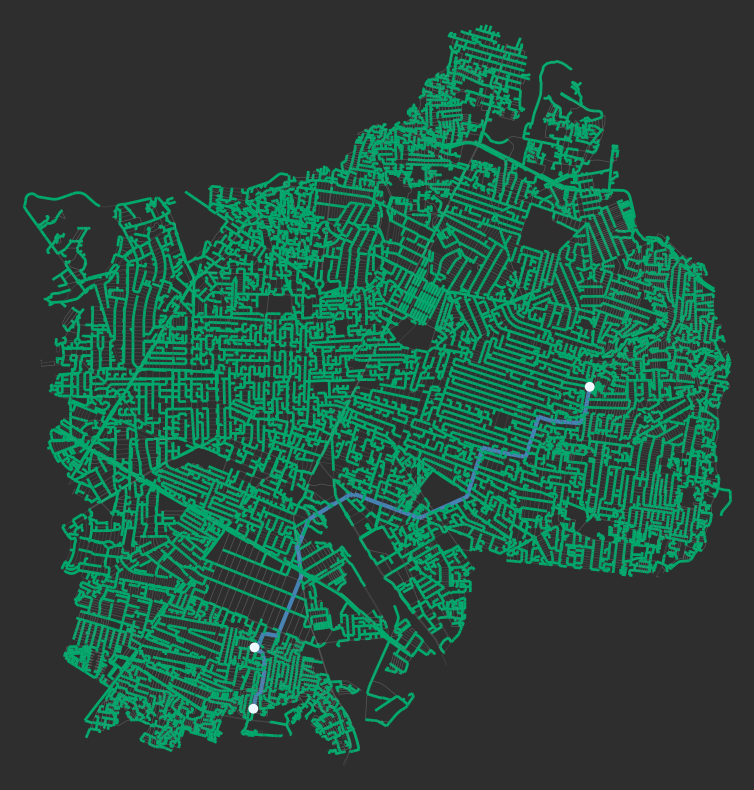

Nodes: 14860		Time: 4.2332s


Dijkstra Algorithm with 18575 nodes
----------------------------------------


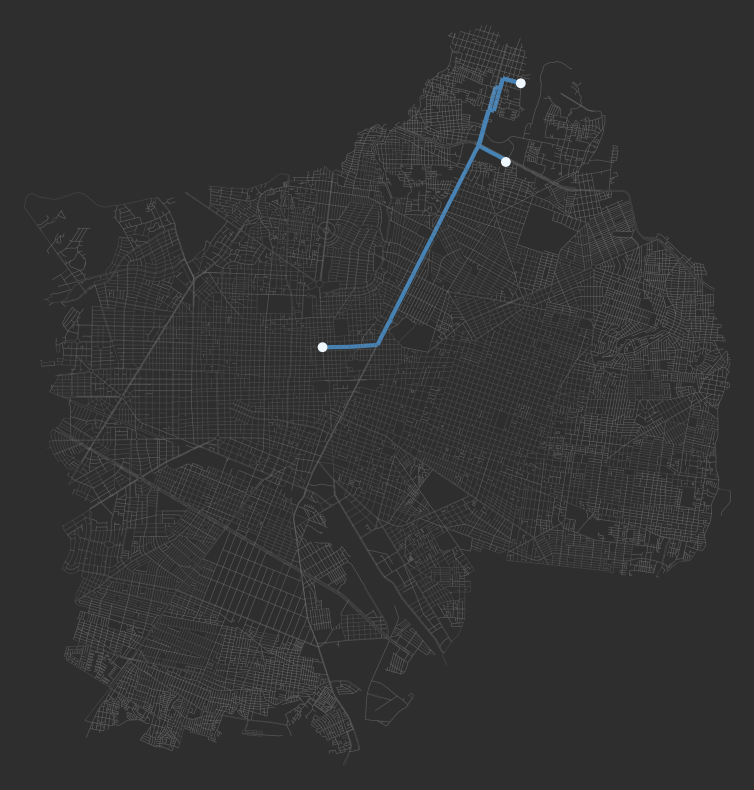

Nodes: 18575		Time: 4.2909s

Prim Algorithm with 18575 nodes
-----------------------------------


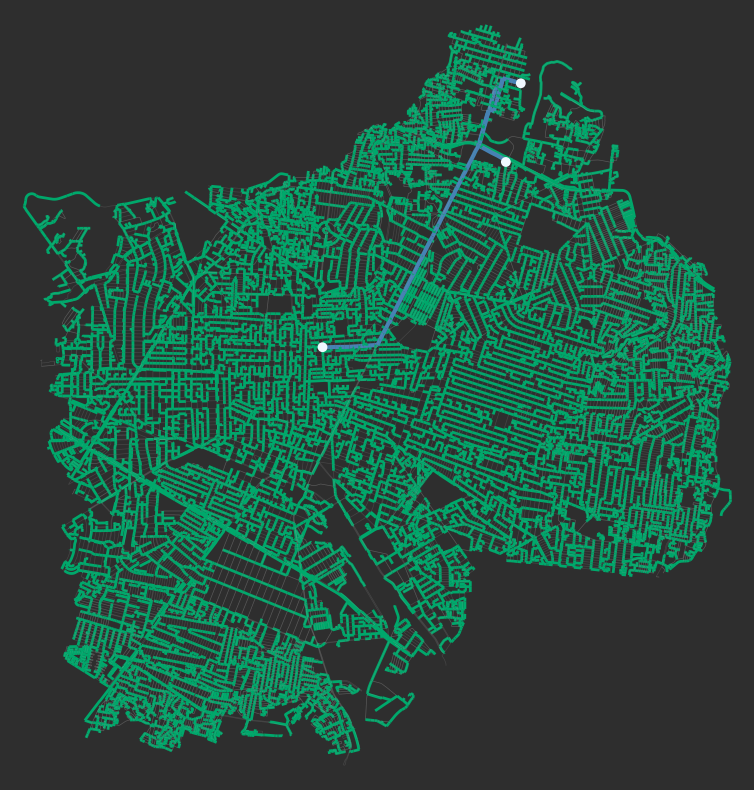

Nodes: 18575		Time: 4.8419s


Dijkstra Algorithm with 22290 nodes
----------------------------------------


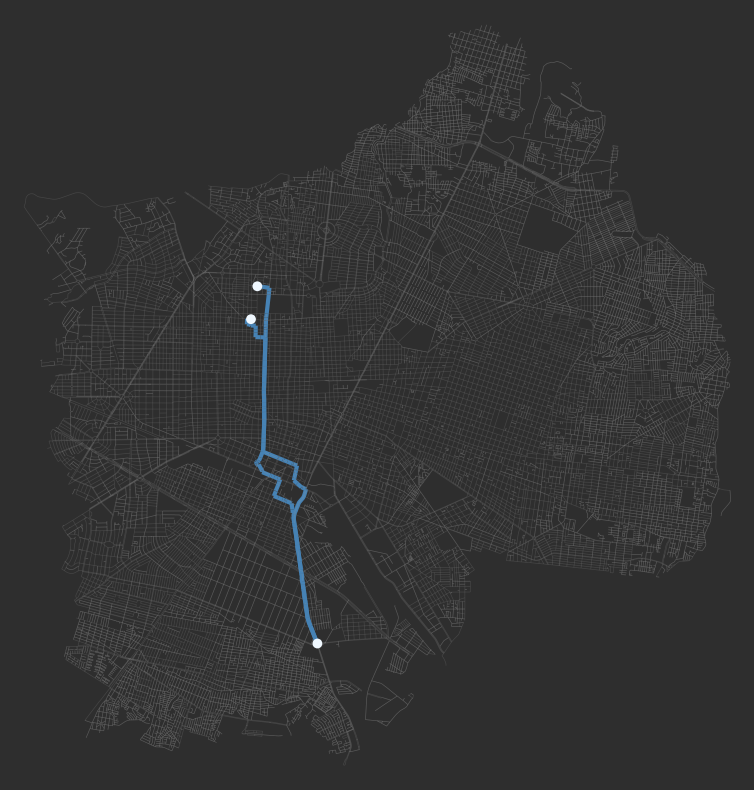

Nodes: 22290		Time: 4.1407s

Prim Algorithm with 22290 nodes
-----------------------------------


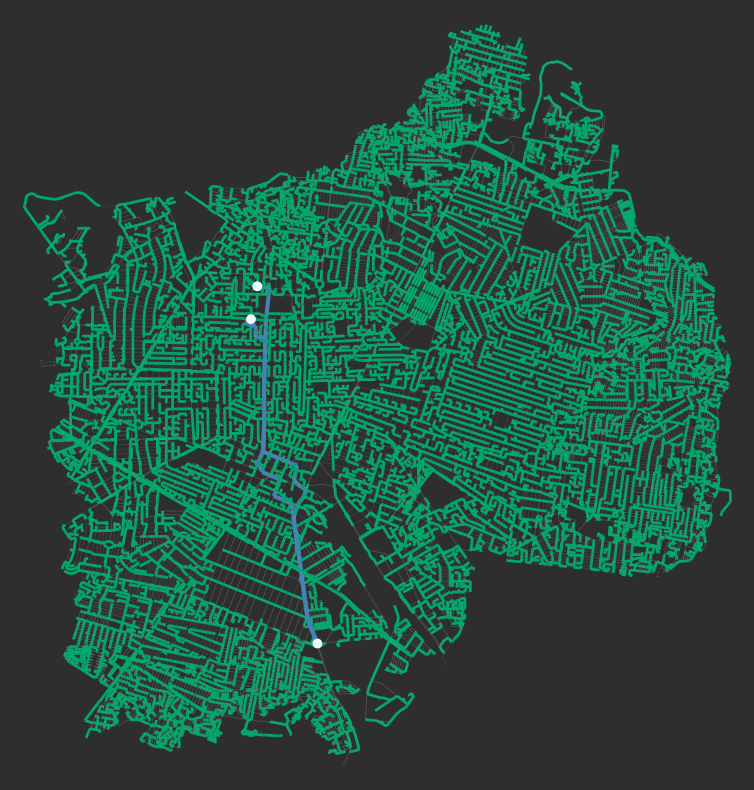

Nodes: 22290		Time: 4.1679s



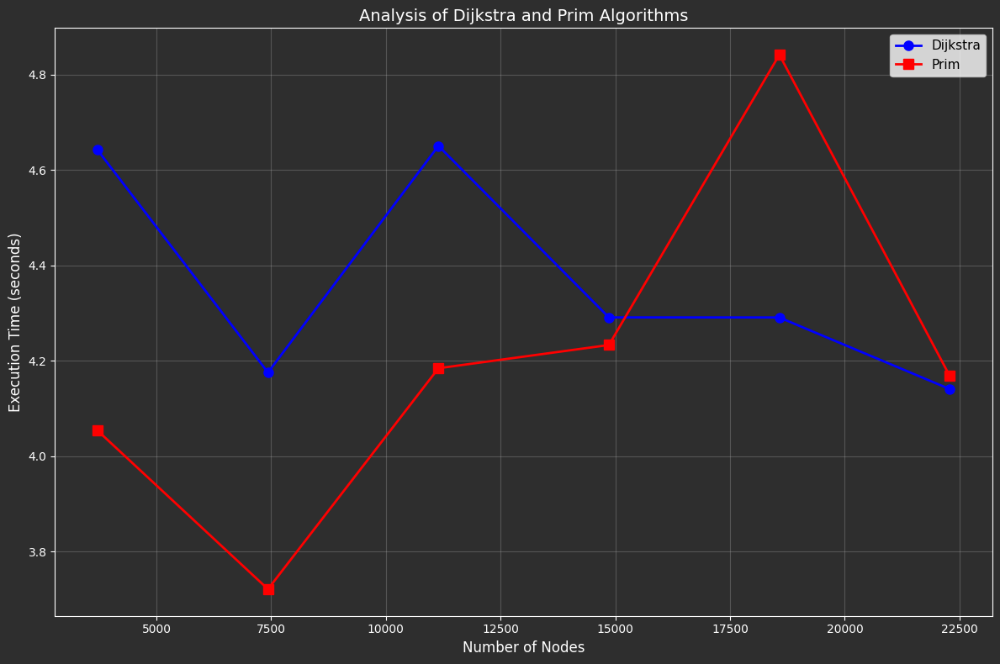


FINAL RESULTS (Sorted by Number of Nodes)
Nodes      Dijkstra Time (s)  Prim Time (s)  
------------------------------------------------------------
3715       4.6421             4.0538         
7430       4.1755             3.7213         
11145      4.6508             4.1845         
14860      4.2910             4.2332         
18575      4.2909             4.8419         
22290      4.1407             4.1679         


In [40]:
import osmnx as ox
import random
import heapq
import time
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Get the urban graph for Guadalajara
city_name = "Guadalajara, Jalisco, Mexico"
urban_graph = ox.graph_from_place(city_name, network_type="drive")

# Add time and weight attributes to edges
for edge in urban_graph.edges:
    estimated_time = 60  # Default time in seconds
    if "length" in urban_graph.edges[edge]:
        estimated_time = urban_graph.edges[edge]["length"] / 16.67  # Assuming average speed of 60 km/h (16.67 m/s)
    urban_graph.edges[edge]["time"] = estimated_time
    urban_graph.edges[edge]["weight"] = estimated_time

# Function to set inactive edge style
def set_inactive_edge_style(edge):
    urban_graph.edges[edge]["color"] = "#A1A1A1"
    urban_graph.edges[edge]["opacity"] = 0.2
    urban_graph.edges[edge]["thickness"] = 0.5

# Function to set MST edge style
def set_mst_edge_style(edge):
    urban_graph.edges[edge]["color"] = "#00A86B"
    urban_graph.edges[edge]["opacity"] = 1
    urban_graph.edges[edge]["thickness"] = 2

# Function to set final path edge style
def set_final_path_style(edge):
    urban_graph.edges[edge]["color"] = "#4682B4"
    urban_graph.edges[edge]["opacity"] = 1
    urban_graph.edges[edge]["thickness"] = 3

# Function to visualize the graph
def visualize_graph():
    # Create figure with dark background
    fig, ax = plt.subplots(figsize=(10, 10), facecolor='#2E2E2E')
    ax.set_facecolor('#2E2E2E')
    
    ox.plot_graph(
        urban_graph,
        ax=ax,
        node_size=[urban_graph.nodes[node].get("size", 0) for node in urban_graph.nodes],
        edge_color=[urban_graph.edges[edge]["color"] for edge in urban_graph.edges],
        edge_alpha=[urban_graph.edges[edge]["opacity"] for edge in urban_graph.edges],
        edge_linewidth=[urban_graph.edges[edge]["thickness"] for edge in urban_graph.edges],
        node_color="#F0F8FF", 
        bgcolor="#2E2E2E",
        show=False,
        close=False
    )
    plt.show()

# Dijkstra's algorithm for individual route calculation
def calculate_individual_route(origin, destination):
    # Initialize nodes
    for node in urban_graph.nodes:
        urban_graph.nodes[node]["visited"] = False
        urban_graph.nodes[node]["distance"] = float("inf")
        urban_graph.nodes[node]["previous"] = None
    
    urban_graph.nodes[origin]["distance"] = 0
    priority_queue = [(0, origin)]
    
    while priority_queue:
        _, current = heapq.heappop(priority_queue)
        
        if current == destination:
            # Reconstruct path
            path = []
            while current is not None:
                path.append(current)
                current = urban_graph.nodes[current]["previous"]
            path.reverse()
            return path
        
        if urban_graph.nodes[current]["visited"]:
            continue
            
        urban_graph.nodes[current]["visited"] = True
        
        for edge in urban_graph.out_edges(current, keys=True):
            neighbor = edge[1]
            weight = urban_graph.edges[edge]["weight"]
            
            if urban_graph.nodes[neighbor]["distance"] > urban_graph.nodes[current]["distance"] + weight:
                urban_graph.nodes[neighbor]["distance"] = urban_graph.nodes[current]["distance"] + weight
                urban_graph.nodes[neighbor]["previous"] = current
                heapq.heappush(priority_queue, (urban_graph.nodes[neighbor]["distance"], neighbor))
    
    return []  # Return empty list if no path found

# Calculate optimal route with intermediate point
def calculate_optimal_route(origin, intermediate, destination, show=False):
    # Reset node sizes
    for node in urban_graph.nodes:
        urban_graph.nodes[node]["size"] = 0
    
    # Set all edges to inactive style
    for edge in urban_graph.edges:
        set_inactive_edge_style(edge)
    
    # Calculate routes
    route_1 = calculate_individual_route(origin, intermediate)
    route_2 = calculate_individual_route(intermediate, destination)
    complete_route = route_1 + route_2[1:]
    
    # Style the final path
    for i in range(len(complete_route) - 1):
        edge = (complete_route[i], complete_route[i + 1], 0)
        if urban_graph.has_edge(complete_route[i], complete_route[i + 1], 0):
            set_final_path_style(edge)
    
    # Highlight important nodes
    urban_graph.nodes[origin]["size"] = 50
    urban_graph.nodes[intermediate]["size"] = 50
    urban_graph.nodes[destination]["size"] = 50
    
    if show:
        visualize_graph()
    
    return complete_route

# Prim's algorithm for Minimum Spanning Tree
def calculate_mst(origin, show=False):
    min_spanning_tree = []
    visited = {origin}
    priority_queue = []
    
    def add_edges(node):
        for neighbor in urban_graph.neighbors(node):
            edge = (node, neighbor, 0)
            if neighbor not in visited:
                heapq.heappush(priority_queue, (urban_graph.edges[edge]["weight"], edge))
    
    add_edges(origin)
    
    while priority_queue:
        weight, edge = heapq.heappop(priority_queue)
        node1, node2, _ = edge
        
        if node2 not in visited:
            visited.add(node2)
            min_spanning_tree.append(edge)
            
            # Style MST edges (if not already part of final path)
            if urban_graph.has_edge(node1, node2, 0) and urban_graph.edges[edge]["color"] != "#4682B4":
                set_mst_edge_style(edge)
                
            add_edges(node2)
    
    if show:
        visualize_graph()
    
    return min_spanning_tree

# Main function to run the analysis
def main():
    results = []
    
    # Calculate step size for sampling nodes
    step_size = max(1, int(len(urban_graph.nodes) / 6))
    node_count = len(urban_graph.nodes)
    
    for subgraph_size in range(step_size, node_count + step_size, step_size):
        if subgraph_size > node_count:
            subgraph_size = node_count
            
        subgraph_nodes = random.sample(list(urban_graph.nodes), subgraph_size)
        start = subgraph_nodes[0]
        intermediate = subgraph_nodes[len(subgraph_nodes) // 2]
        end = subgraph_nodes[-1]
        
        print(f"\nDijkstra Algorithm with {subgraph_size} nodes")
        print("-" * 40)
        start_time = time.time()
        calculate_optimal_route(start, intermediate, end, show=True)
        route_time = time.time() - start_time
        print(f"Nodes: {subgraph_size}\t\tTime: {route_time:.4f}s")
        
        print(f"\nPrim Algorithm with {subgraph_size} nodes")
        print("-" * 35)
        start_time = time.time()
        calculate_mst(start, show=True)
        mst_time = time.time() - start_time
        print(f"Nodes: {subgraph_size}\t\tTime: {mst_time:.4f}s")
        print("\n" + "="*50)
        
        results.append((subgraph_size, route_time, mst_time))
        
        if subgraph_size >= node_count:
            break
    
    # Sort results by number of nodes before plotting
    results.sort(key=lambda x: x[0])
    
    # Extract sorted data for plotting
    sizes = [r[0] for r in results]
    route_times = [r[1] for r in results]
    mst_times = [r[2] for r in results]
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    ax = plt.gca()
    ax.set_facecolor('#2E2E2E')
    fig = plt.gcf()
    fig.set_facecolor('#2E2E2E')
    
    # Plot the data
    plt.plot(sizes, route_times, label="Dijkstra", marker="o", color="blue", linewidth=2, markersize=8)
    plt.plot(sizes, mst_times, label="Prim", marker="s", color="red", linewidth=2, markersize=8)
    
    # Configure plot labels and title
    plt.xlabel("Number of Nodes", color='white', fontsize=12)
    plt.ylabel("Execution Time (seconds)", color='white', fontsize=12)
    plt.title("Analysis of Dijkstra and Prim Algorithms", color='white', fontsize=14)
    plt.legend(fontsize=11)
    
    # Set tick colors to white for visibility on dark background
    ax.tick_params(colors='white')
    ax.grid(True, alpha=0.3)
    
    # Set spine colors to white
    for spine in ax.spines.values():
        spine.set_color('white')
    
    plt.tight_layout()
    plt.show()
    
    # Print sorted results table
    print("\n" + "="*60)
    print("FINAL RESULTS (Sorted by Number of Nodes)")
    print("="*60)
    print(f"{'Nodes':<10} {'Dijkstra Time (s)':<18} {'Prim Time (s)':<15}")
    print("-"*60)
    for size, dijkstra_time, prim_time in results:
        print(f"{size:<10} {dijkstra_time:<18.4f} {prim_time:<15.4f}")

# Run the main function
if __name__ == "__main__":
    main()


Dijkstra Algorithm with 3715 nodes
----------------------------------------


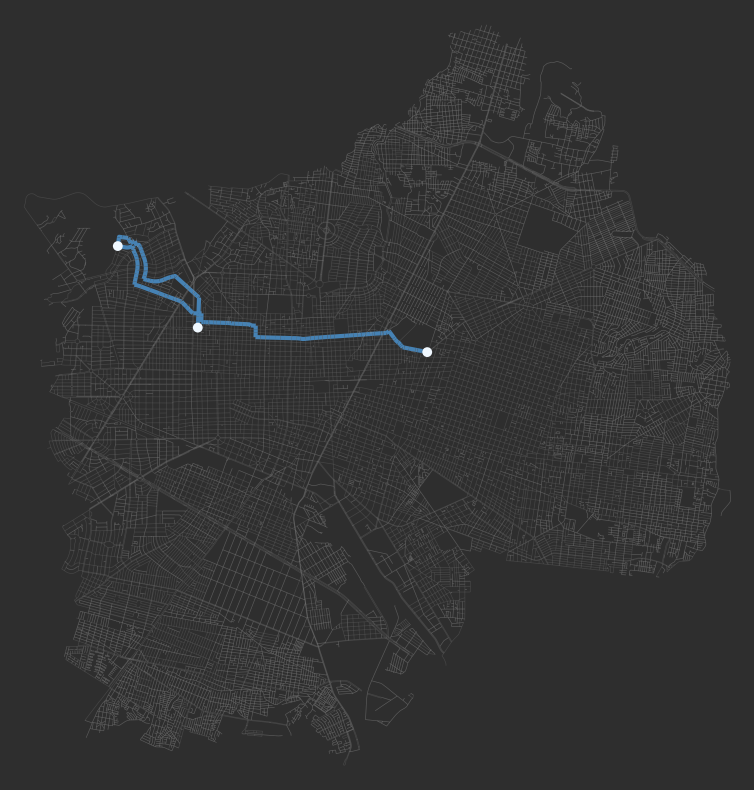

Nodes: 3715		Time: 3.9617s

Prim Algorithm with 3715 nodes
-----------------------------------


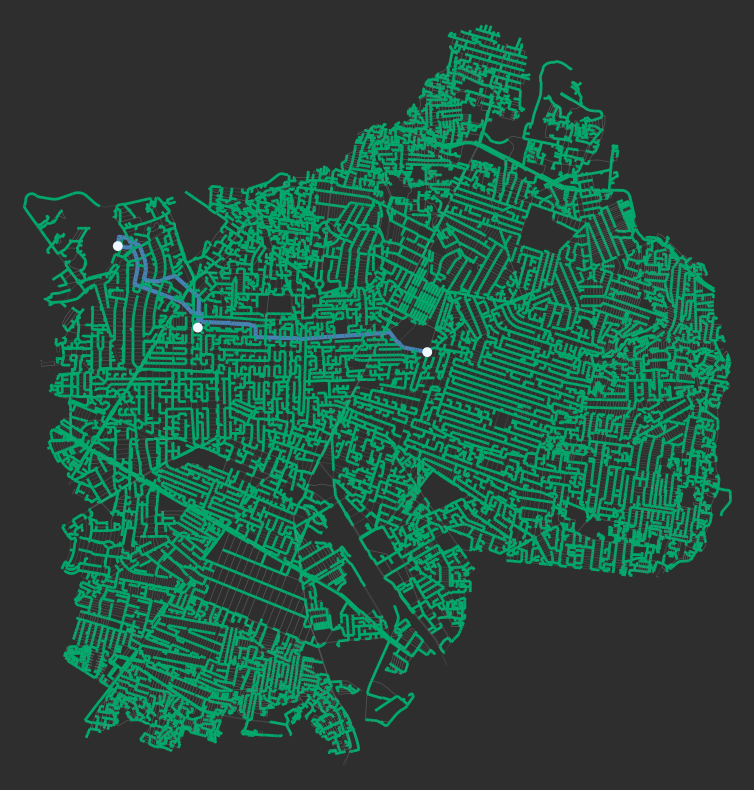

Nodes: 3715		Time: 4.6122s


Dijkstra Algorithm with 7430 nodes
----------------------------------------


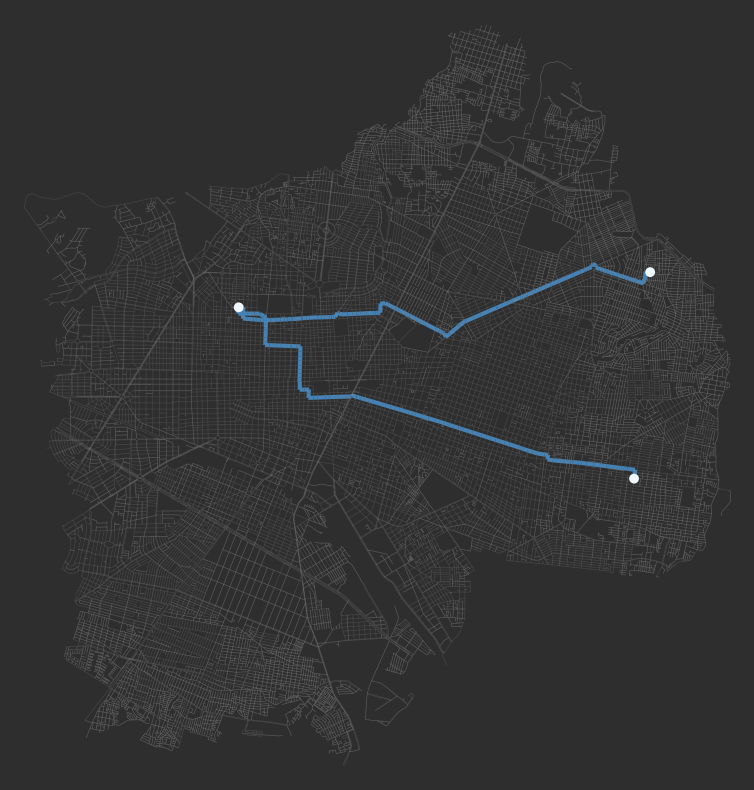

Nodes: 7430		Time: 4.5405s

Prim Algorithm with 7430 nodes
-----------------------------------


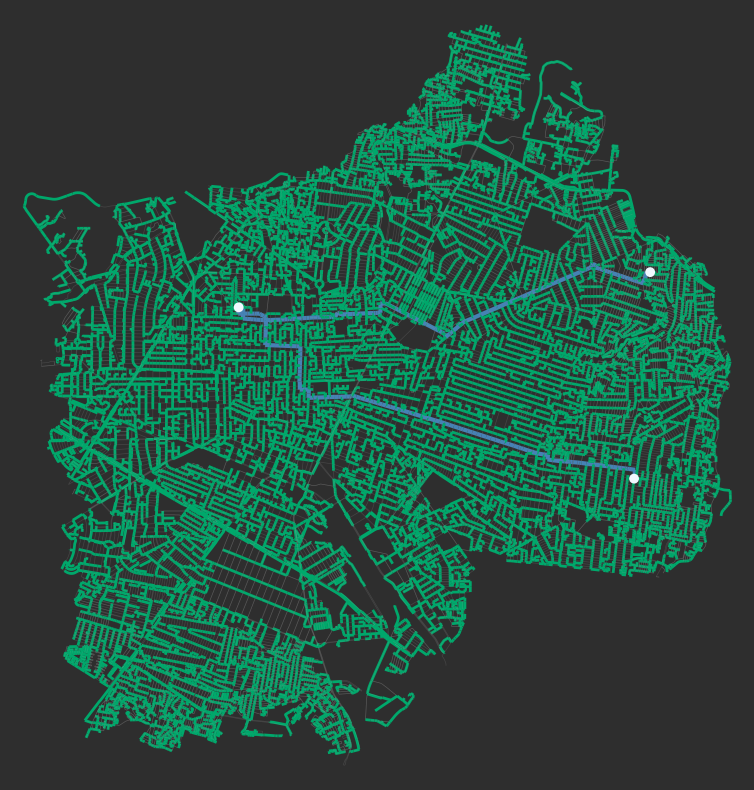

Nodes: 7430		Time: 4.1991s


Dijkstra Algorithm with 11145 nodes
----------------------------------------


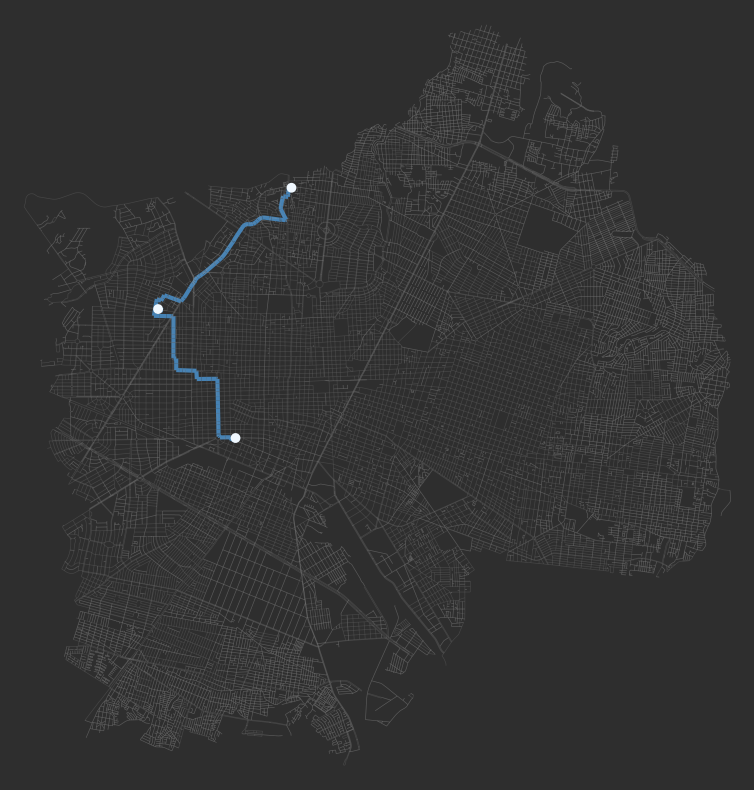

Nodes: 11145		Time: 3.9093s

Prim Algorithm with 11145 nodes
-----------------------------------


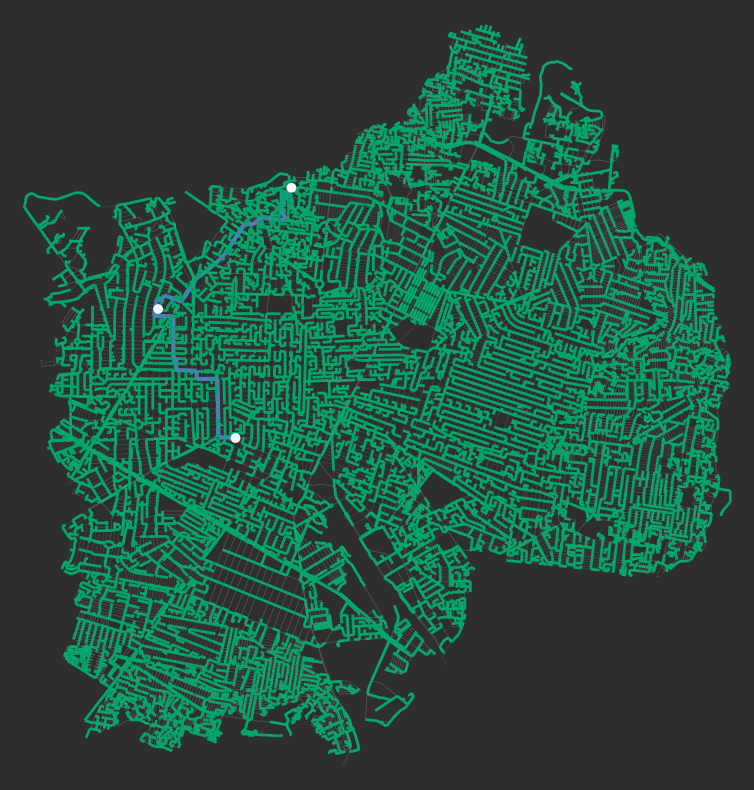

Nodes: 11145		Time: 4.2742s


Dijkstra Algorithm with 14860 nodes
----------------------------------------


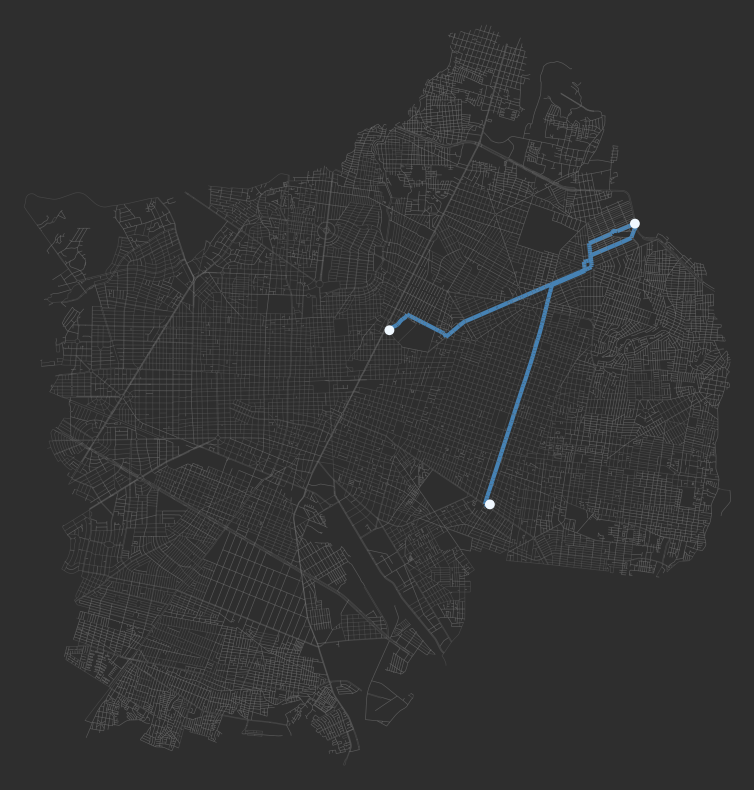

Nodes: 14860		Time: 4.4062s

Prim Algorithm with 14860 nodes
-----------------------------------


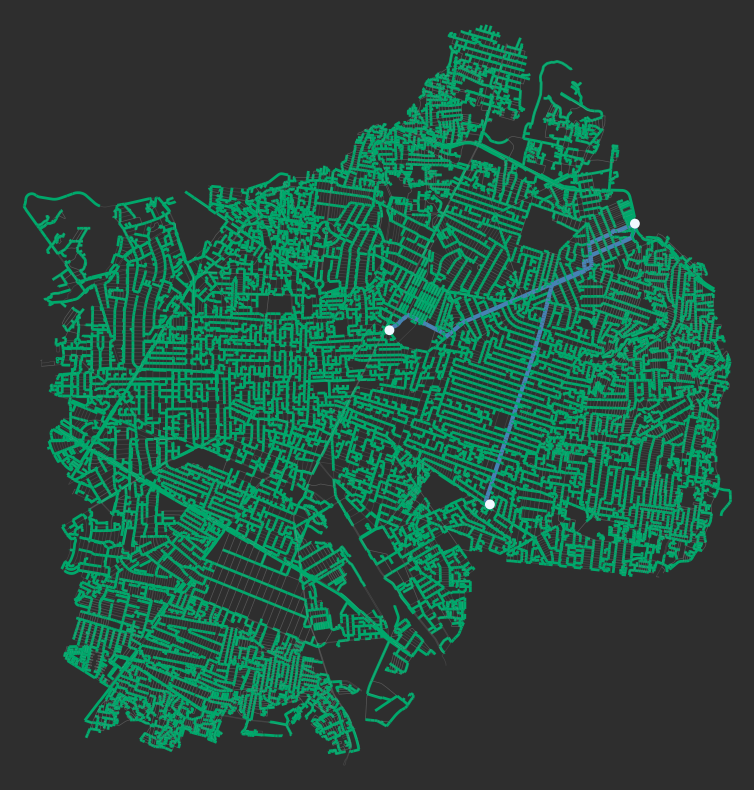

Nodes: 14860		Time: 4.3207s


Dijkstra Algorithm with 18575 nodes
----------------------------------------


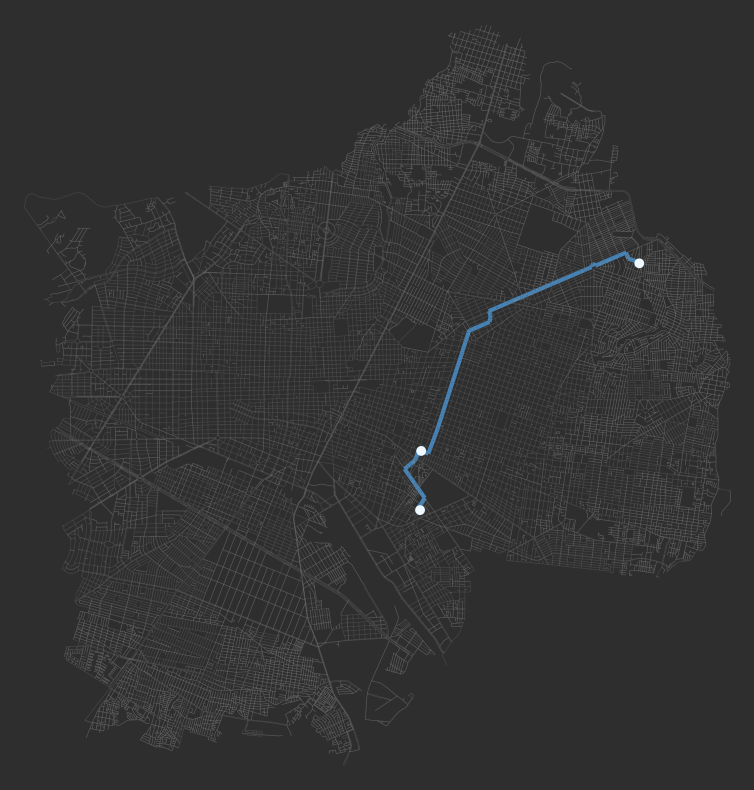

Nodes: 18575		Time: 4.3421s

Prim Algorithm with 18575 nodes
-----------------------------------


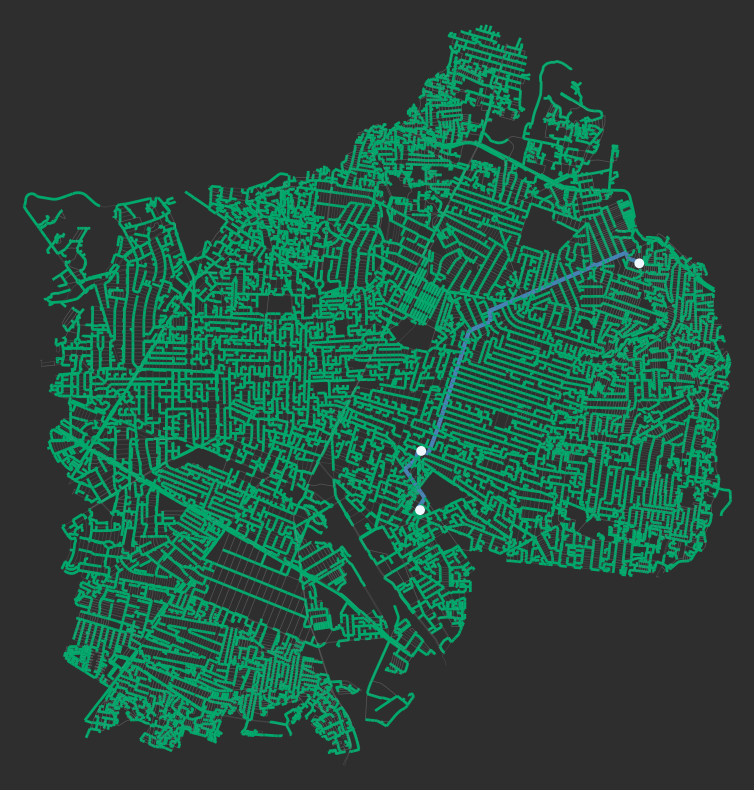

Nodes: 18575		Time: 4.4743s


Dijkstra Algorithm with 22290 nodes
----------------------------------------


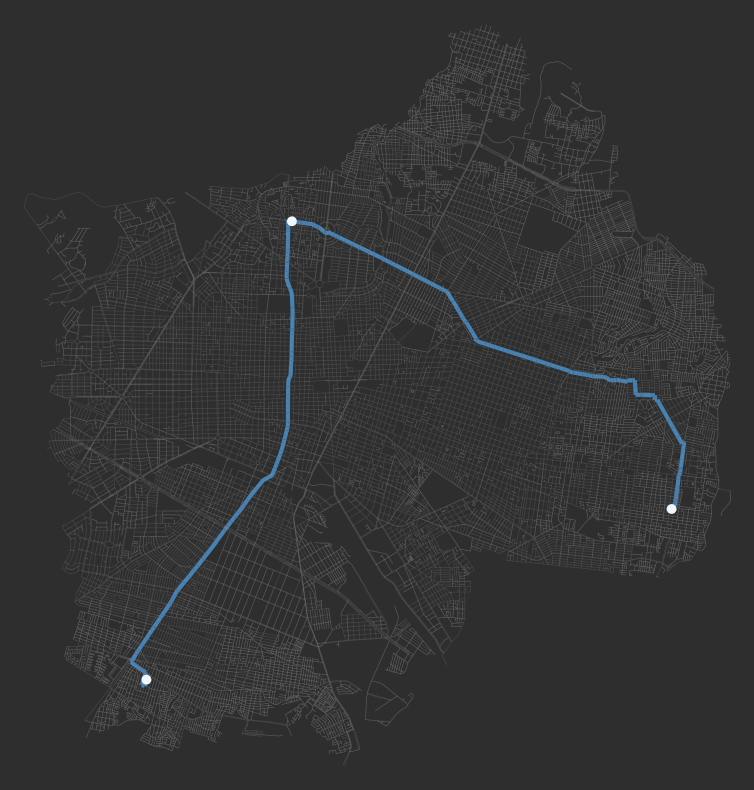

Nodes: 22290		Time: 4.4920s

Prim Algorithm with 22290 nodes
-----------------------------------


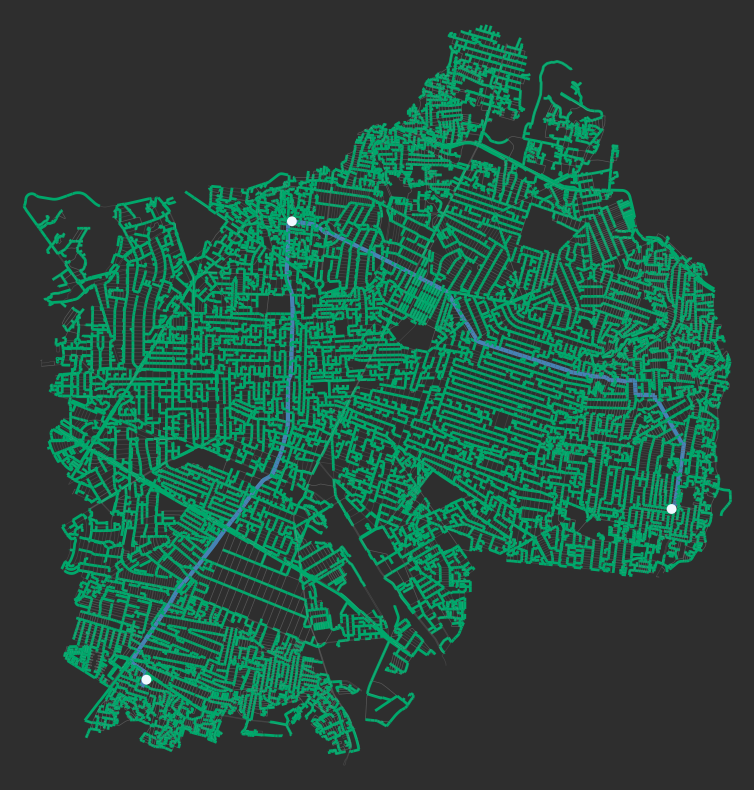

Nodes: 22290		Time: 3.8053s



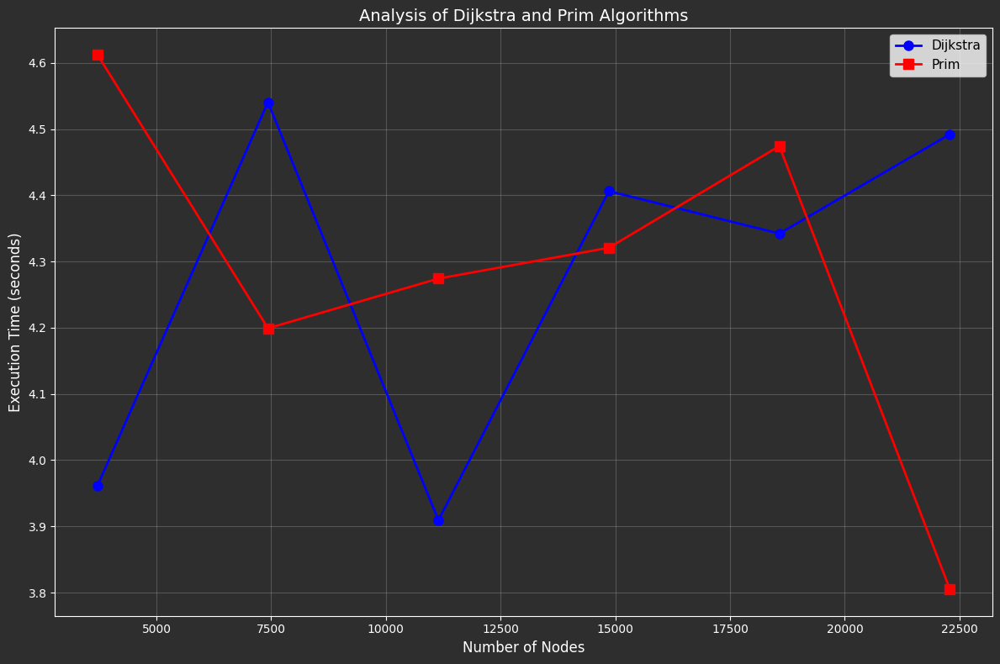


FINAL RESULTS (Sorted by Number of Nodes)
Nodes      Dijkstra Time (s)  Prim Time (s)  
------------------------------------------------------------
3715       3.9617             4.6122         
7430       4.5405             4.1991         
11145      3.9093             4.2742         
14860      4.4062             4.3207         
18575      4.3421             4.4743         
22290      4.4920             3.8053         


In [ ]:
import osmnx as ox
import random
import heapq
import time
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Get the urban graph for Guadalajara
city_name = "Guadalajara, Jalisco, Mexico"
urban_graph = ox.graph_from_place(city_name, network_type="drive")

# Add time and weight attributes to edges
for edge in urban_graph.edges:
    estimated_time = 60  # Default time in seconds
    if "length" in urban_graph.edges[edge]:
        estimated_time = urban_graph.edges[edge]["length"] / 16.67  # Assuming average speed of 60 km/h (16.67 m/s)
    urban_graph.edges[edge]["time"] = estimated_time
    urban_graph.edges[edge]["weight"] = estimated_time

# Function to set inactive edge style
def set_inactive_edge_style(edge):
    urban_graph.edges[edge]["color"] = "#A1A1A1"
    urban_graph.edges[edge]["opacity"] = 0.2
    urban_graph.edges[edge]["thickness"] = 0.5

# Function to set MST edge style
def set_mst_edge_style(edge):
    urban_graph.edges[edge]["color"] = "#00A86B"
    urban_graph.edges[edge]["opacity"] = 1
    urban_graph.edges[edge]["thickness"] = 2

# Function to set final path edge style
def set_final_path_style(edge):
    urban_graph.edges[edge]["color"] = "#4682B4"
    urban_graph.edges[edge]["opacity"] = 1
    urban_graph.edges[edge]["thickness"] = 3

# Function to visualize the graph
def visualize_graph():
    # Create figure with dark background
    fig, ax = plt.subplots(figsize=(10, 10), facecolor='#2E2E2E')
    ax.set_facecolor('#2E2E2E')
    
    ox.plot_graph(
        urban_graph,
        ax=ax,
        node_size=[urban_graph.nodes[node].get("size", 0) for node in urban_graph.nodes],
        edge_color=[urban_graph.edges[edge]["color"] for edge in urban_graph.edges],
        edge_alpha=[urban_graph.edges[edge]["opacity"] for edge in urban_graph.edges],
        edge_linewidth=[urban_graph.edges[edge]["thickness"] for edge in urban_graph.edges],
        node_color="#F0F8FF", 
        bgcolor="#2E2E2E",
        show=False,
        close=False
    )
    plt.show()

# Dijkstra's algorithm for individual route calculation
def calculate_individual_route(origin, destination):
    # Initialize nodes
    for node in urban_graph.nodes:
        urban_graph.nodes[node]["visited"] = False
        urban_graph.nodes[node]["distance"] = float("inf")
        urban_graph.nodes[node]["previous"] = None
    
    urban_graph.nodes[origin]["distance"] = 0
    priority_queue = [(0, origin)]
    
    while priority_queue:
        _, current = heapq.heappop(priority_queue)
        
        if current == destination:
            # Reconstruct path
            path = []
            while current is not None:
                path.append(current)
                current = urban_graph.nodes[current]["previous"]
            path.reverse()
            return path
        
        if urban_graph.nodes[current]["visited"]:
            continue
            
        urban_graph.nodes[current]["visited"] = True
        
        for edge in urban_graph.out_edges(current, keys=True):
            neighbor = edge[1]
            weight = urban_graph.edges[edge]["weight"]
            
            if urban_graph.nodes[neighbor]["distance"] > urban_graph.nodes[current]["distance"] + weight:
                urban_graph.nodes[neighbor]["distance"] = urban_graph.nodes[current]["distance"] + weight
                urban_graph.nodes[neighbor]["previous"] = current
                heapq.heappush(priority_queue, (urban_graph.nodes[neighbor]["distance"], neighbor))
    
    return []  # Return empty list if no path found

# Calculate optimal route with intermediate point
def calculate_optimal_route(origin, intermediate, destination, show=False):
    # Reset node sizes
    for node in urban_graph.nodes:
        urban_graph.nodes[node]["size"] = 0
    
    # Set all edges to inactive style
    for edge in urban_graph.edges:
        set_inactive_edge_style(edge)
    
    # Calculate routes
    route_1 = calculate_individual_route(origin, intermediate)
    route_2 = calculate_individual_route(intermediate, destination)
    complete_route = route_1 + route_2[1:]
    
    # Style the final path
    for i in range(len(complete_route) - 1):
        edge = (complete_route[i], complete_route[i + 1], 0)
        if urban_graph.has_edge(complete_route[i], complete_route[i + 1], 0):
            set_final_path_style(edge)
    
    # Highlight important nodes
    urban_graph.nodes[origin]["size"] = 50
    urban_graph.nodes[intermediate]["size"] = 50
    urban_graph.nodes[destination]["size"] = 50
    
    if show:
        visualize_graph()
    
    return complete_route

# Prim's algorithm for Minimum Spanning Tree
def calculate_mst(origin, show=False):
    min_spanning_tree = []
    visited = {origin}
    priority_queue = []
    
    def add_edges(node):
        for neighbor in urban_graph.neighbors(node):
            edge = (node, neighbor, 0)
            if neighbor not in visited:
                heapq.heappush(priority_queue, (urban_graph.edges[edge]["weight"], edge))
    
    add_edges(origin)
    
    while priority_queue:
        weight, edge = heapq.heappop(priority_queue)
        node1, node2, _ = edge
        
        if node2 not in visited:
            visited.add(node2)
            min_spanning_tree.append(edge)
            
            # Style MST edges (if not already part of final path)
            if urban_graph.has_edge(node1, node2, 0) and urban_graph.edges[edge]["color"] != "#4682B4":
                set_mst_edge_style(edge)
                
            add_edges(node2)
    
    if show:
        visualize_graph()
    
    return min_spanning_tree

# Main function to run the analysis
def main():
    results = []
    
    # Calculate step size for sampling nodes
    step_size = max(1, int(len(urban_graph.nodes) / 6))
    node_count = len(urban_graph.nodes)
    
    for subgraph_size in range(step_size, node_count + step_size, step_size):
        if subgraph_size > node_count:
            subgraph_size = node_count
            
        subgraph_nodes = random.sample(list(urban_graph.nodes), subgraph_size)
        start = subgraph_nodes[0]
        intermediate = subgraph_nodes[len(subgraph_nodes) // 2]
        end = subgraph_nodes[-1]
        
        print(f"\nDijkstra Algorithm with {subgraph_size} nodes")
        print("-" * 40)
        start_time = time.time()
        calculate_optimal_route(start, intermediate, end, show=True)
        route_time = time.time() - start_time
        print(f"Nodes: {subgraph_size}\t\tTime: {route_time:.4f}s")
        
        print(f"\nPrim Algorithm with {subgraph_size} nodes")
        print("-" * 35)
        start_time = time.time()
        calculate_mst(start, show=True)
        mst_time = time.time() - start_time
        print(f"Nodes: {subgraph_size}\t\tTime: {mst_time:.4f}s")
        print("\n" + "="*50)
        
        results.append((subgraph_size, route_time, mst_time))
        
        if subgraph_size >= node_count:
            break
    
    # Sort results by number of nodes before plotting
    results.sort(key=lambda x: x[0])
    
    # Extract sorted data for plotting
    sizes = [r[0] for r in results]
    route_times = [r[1] for r in results]
    mst_times = [r[2] for r in results]
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    ax = plt.gca()
    ax.set_facecolor('#2E2E2E')
    fig = plt.gcf()
    fig.set_facecolor('#2E2E2E')
    
    # Plot the data
    plt.plot(sizes, route_times, label="Dijkstra", marker="o", color="blue", linewidth=2, markersize=8)
    plt.plot(sizes, mst_times, label="Prim", marker="s", color="red", linewidth=2, markersize=8)
    
    # Configure plot labels and title
    plt.xlabel("Number of Nodes", color='white', fontsize=12)
    plt.ylabel("Execution Time (seconds)", color='white', fontsize=12)
    plt.title("Analysis of Dijkstra and Prim Algorithms", color='white', fontsize=14)
    plt.legend(fontsize=11)
    
    # Set tick colors to white for visibility on dark background
    ax.tick_params(colors='white')
    ax.grid(True, alpha=0.3)
    
    # Set spine colors to white
    for spine in ax.spines.values():
        spine.set_color('white')
    
    plt.tight_layout()
    plt.show()
    
    # Print sorted results table
    print("\n" + "="*60)
    print("FINAL RESULTS (Sorted by Number of Nodes)")
    print("="*60)
    print(f"{'Nodes':<10} {'Dijkstra Time (s)':<18} {'Prim Time (s)':<15}")
    print("-"*60)
    for size, dijkstra_time, prim_time in results:
        print(f"{size:<10} {dijkstra_time:<18.4f} {prim_time:<15.4f}")

# Run the main function
if __name__ == "__main__":
    main()